In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from collections import defaultdict
import seaborn as sns


df = pd.read_excel('c:\\Users\\oadeji01\\OneDrive - Tufts\\Bunmi - NavehLab-01\\Raman_Bunmi\\Master_Data\\Data_Master_Sheet1.xlsx', sheet_name = "Master")

In [28]:
# --- Peak models ---
def gaussian(x, amp, cen, wid):
    return amp * np.exp(-(x - cen) ** 2 / (2 * wid ** 2))

def lorentzian(x, amp, cen, wid):
    return amp * (wid**2 / ((x - cen)**2 + wid**2))

# --- Peak fitting function ---
def fit_peak(x, y, peak_pos, window=5, model="gaussian"):
    # Subset spectrum around the suggested peak
    mask = (x >= peak_pos - window) & (x <= peak_pos + window)
    x_region, y_region = x[mask], y[mask]

    if len(x_region) < 5:  # too few points to fit
        return None

    # Initial guess
    amp_guess = np.max(y_region)
    cen_guess = x_region[np.argmax(y_region)]
    wid_guess = (x_region[-1] - x_region[0]) / 4

    if model == "gaussian":
        func = gaussian
    else:
        func = lorentzian

    try:
        popt, _ = curve_fit(func, x_region, y_region, p0=[amp_guess, cen_guess, wid_guess])
        amp, cen, wid = popt

        # Area and FWHM formulas
        if model == "gaussian":
            fwhm = 2.3548 * wid
            area = amp * wid * np.sqrt(2 * np.pi)
        else:  # Lorentzian
            fwhm = 2 * wid
            area = np.pi * amp * wid

        return {"peak_pos": peak_pos, "fit_pos": cen, "amp": amp, "fwhm": fwhm, "area": area}

    except RuntimeError:
        return None

# --- Main function ---
def analyze_spectra(df, peak_positions, model="gaussian"):
    results = []
    x = df.iloc[:, 7:].columns.astype(float).values

    # Average spectra by group
   # grouped = df.drop(['exp', 'spectra_num'], axis=1).groupby("details").mean(numeric_only=True)
    dff = df.iloc[:, 6:].set_index('details1')

    for peak in peak_positions:
        for group, spectrum in dff.iterrows():
        #grouped.iterrows():
            y = spectrum.values
            fit = fit_peak(x, y, peak, model=model)
            if fit:
                fit["group"] = group
                results.append(fit)

                # Plot
                '''plt.figure(figsize=(6, 4))
                plt.plot(x, y, label=f"{group} spectrum")
                plt.axvline(peak, color="gray", linestyle="--", lw=0.5, label="suggested peak")

                # Overlay fitted peak
                if model == "gaussian":
                    fit_curve = gaussian(x, fit["amp"], fit["fit_pos"], fit["fwhm"]/2.3548)
                else:
                    fit_curve = lorentzian(x, fit["amp"], fit["fit_pos"], fit["fwhm"]/2)
                plt.plot(x, fit_curve, "r--", label=f"Fitted {model}")

                plt.title(f"Peak fit near {peak} cm⁻¹ ({group})")
                plt.xlabel("Raman Shift (cm⁻¹)")
                plt.ylabel("Intensity (a.u.)")
                plt.legend()
                plt.show()'''

    return pd.DataFrame(results)



In [57]:
def plot_spectra(df, peak_positions, model="gaussian"):
    x = df.iloc[:, 7:].columns.astype(float).values
    grouped = df.drop(['exp', 'spectra_num'], axis=1).groupby("details1").mean(numeric_only=True)
    for group, spectrum in grouped.iterrows():
                y = spectrum.values
                fits_for_group = []

                plt.figure(figsize=(10, 5))
                plt.plot(x, y, label=f"{group} spectrum", color="black")

                for peak in peak_positions:
                    fit = fit_peak(x, y, peak, model=model)
                    if fit:
                        fit["group"] = group
                        fits_for_group.append(fit)
                        #results.append(fit)
        # overlay fitted curve
                        if model == "gaussian":
                            fit_curve = gaussian(x, fit["amp"], fit["fit_pos"], fit["fwhm"]/2.3548)
                        else:  # lorentzian
                            fit_curve = lorentzian(x, fit["amp"], fit["fit_pos"], fit["fwhm"]/2)

                        plt.plot(x, fit_curve, "--", label=f"Fit @ {fit['fit_pos']:.1f} cm⁻¹")

                        # vertical line at target peak
                        plt.axvline(peak, color="gray", linestyle=":", lw=0.8)

                plt.title(f"Peak fits for {group}")
                plt.xlabel("Raman Shift (cm⁻¹)")
                plt.ylabel("Intensity (a.u.)")
                plt.xticks(np.arange(750, 1800, 100))
                plt.legend(fontsize=8, bbox_to_anchor = (1,1))
                plt.tight_layout()
                plt.show()


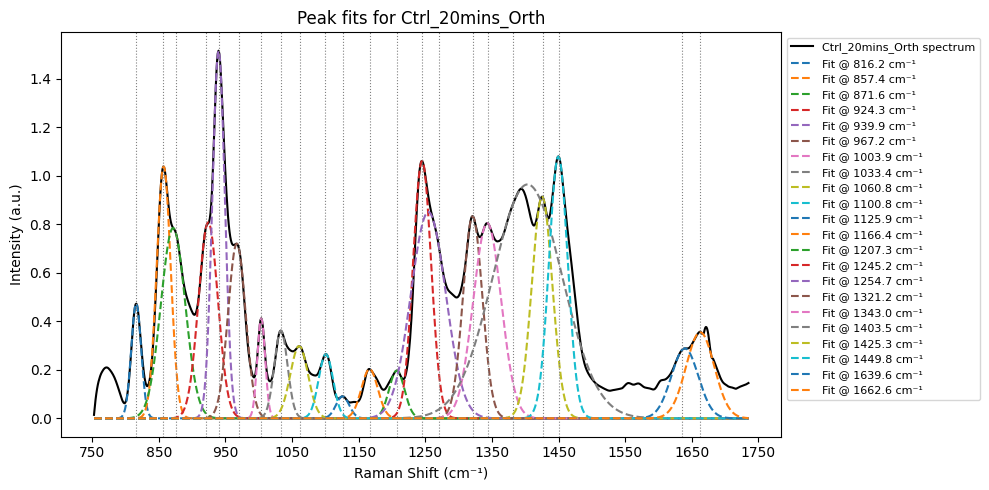

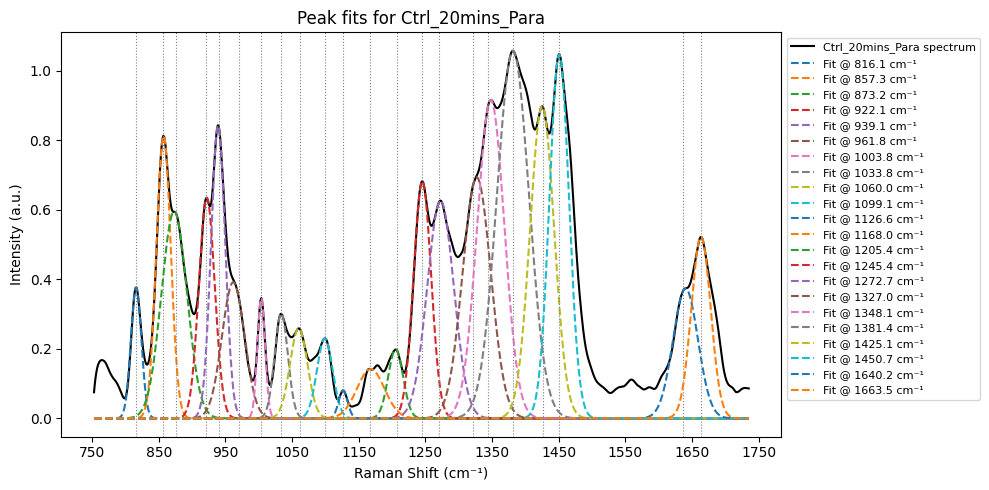

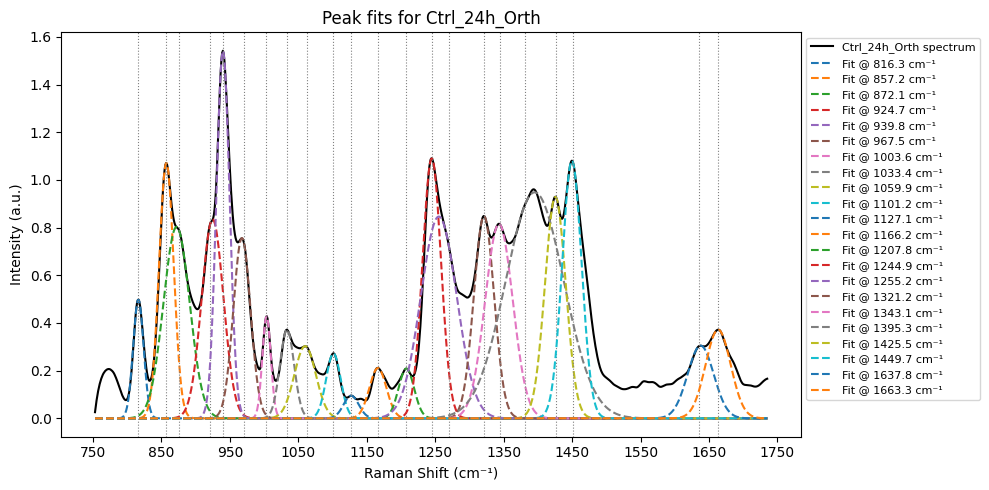

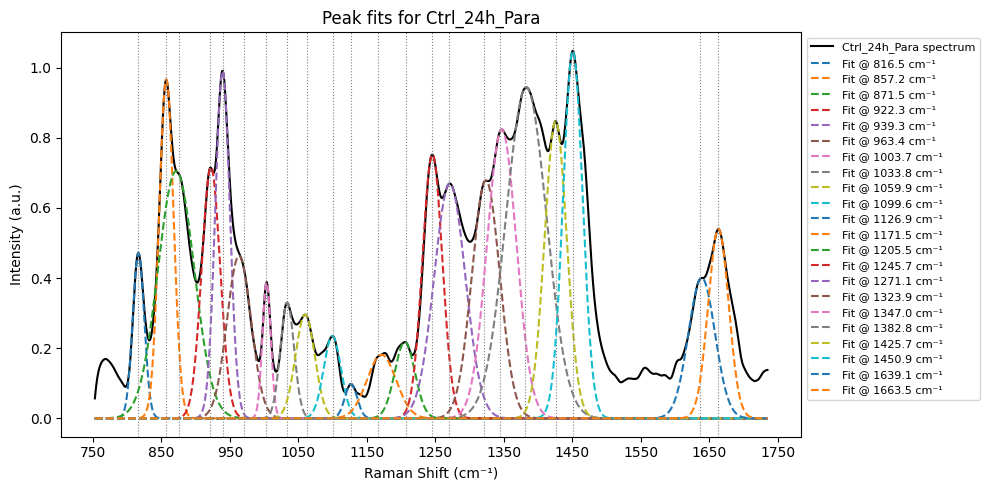

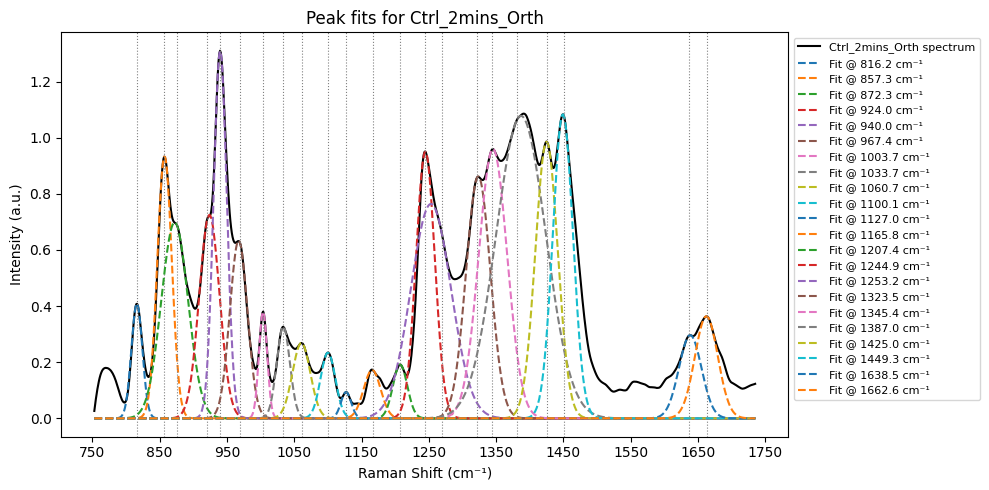

...

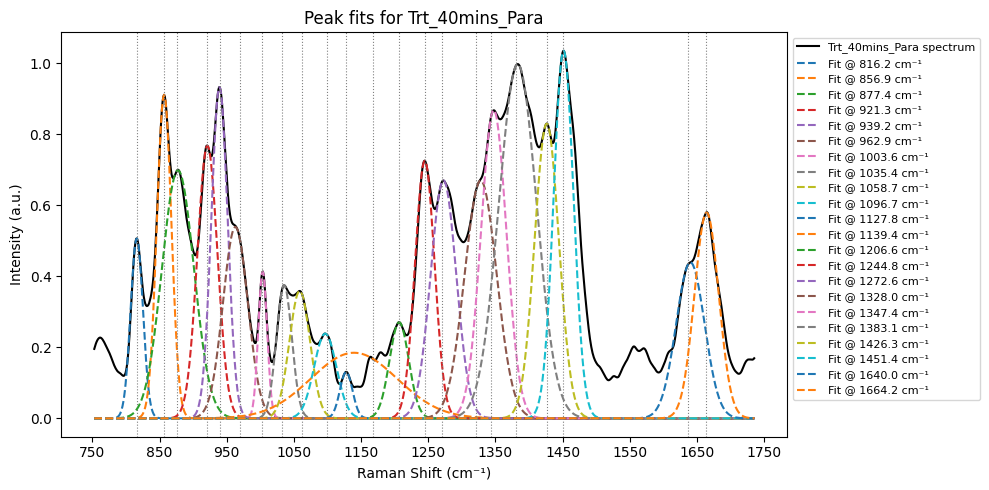

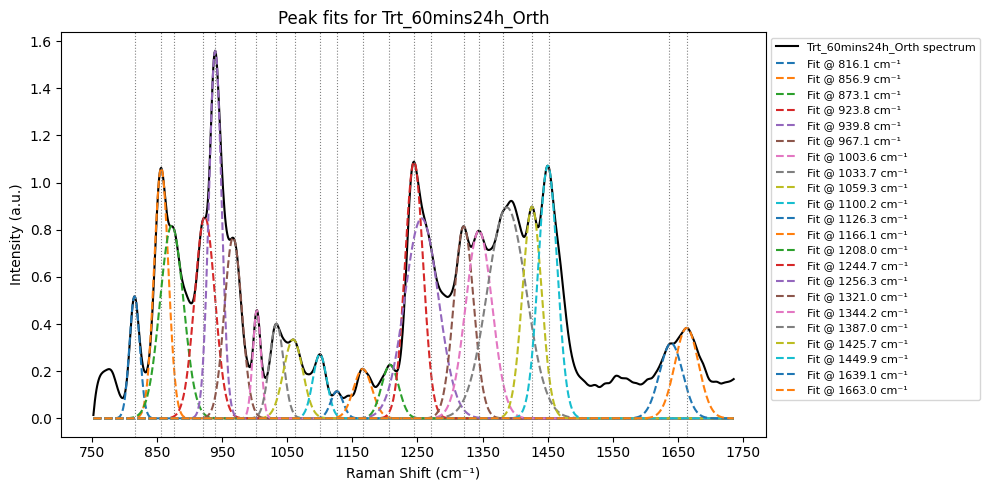

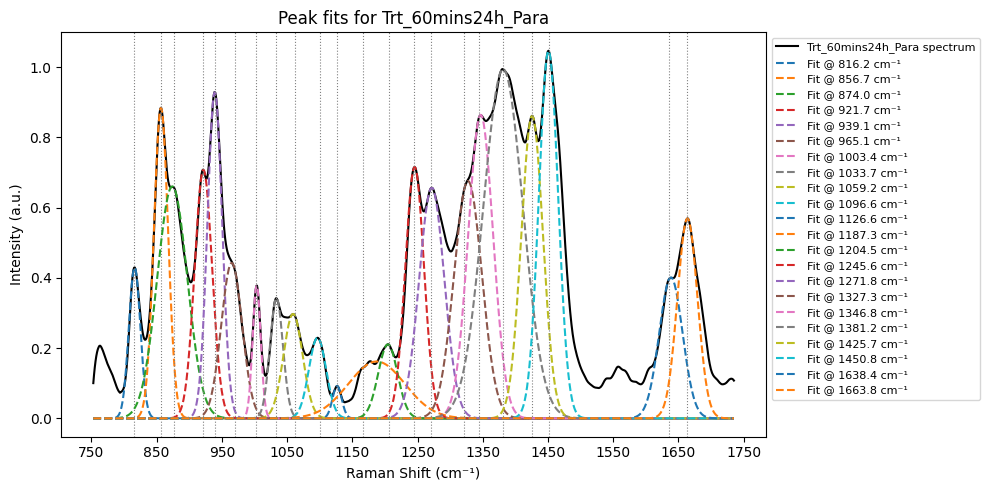

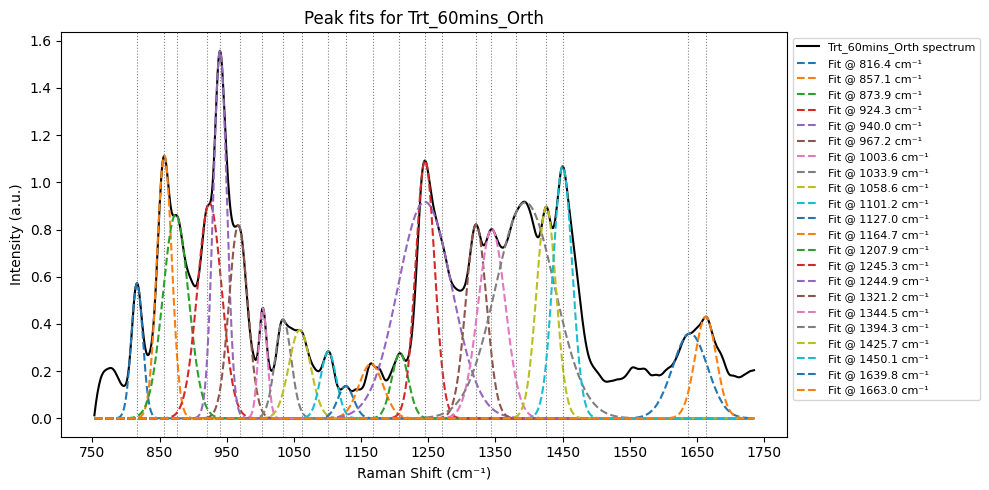

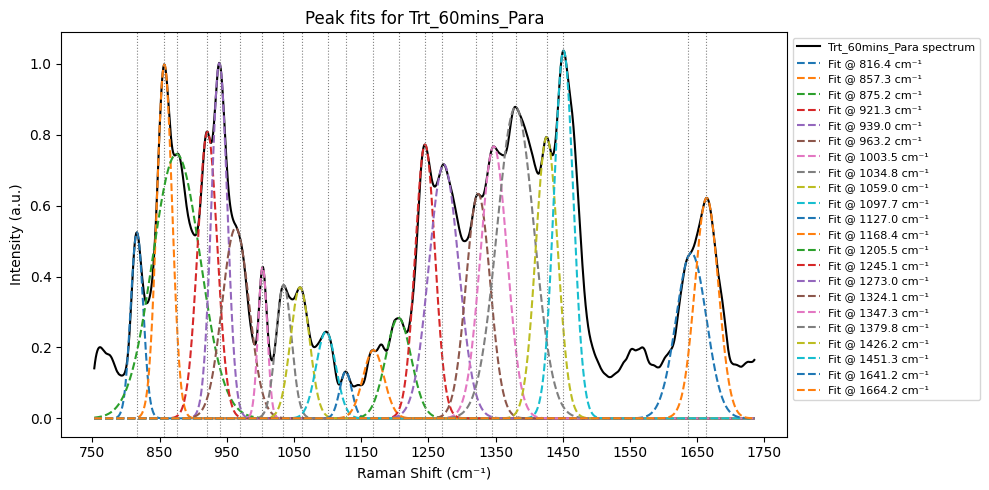

In [ ]:
peak_positions = [816, 857, 876, 921, 940, 970, 1003, 1033, 1062, 1100, 
                  1127, 1167, 1207, 1245, 1270, 1321, 1344, 1381, 1426, 1451, 1636, 1663]
results = plot_spectra(df, peak_positions, model="gaussian")

In [68]:
# --- Example usage ---
#df = pd.read_csv("raman_spectra.csv")  # must include a 'details' column peak_positions = [1000, 1200, 1450, 1650]
peak_positions = [816, 857, 876, 921, 940, 970, 1003, 1033, 1062, 1100, 
                  1127, 1167, 1207, 1245, 1270, 1321, 1344, 1381, 1426, 1451, 1636, 1663]
results = analyze_spectra(df, peak_positions, model="gaussian")
#print(results)

In [69]:
results

,peak_pos,fit_pos,amp,fwhm,area,group
0,816,816.680101,0.415721,15.127667,6.694370,Ctrl_20mins_Orth
1,816,817.708363,0.421044,16.336997,7.322099,Ctrl_20mins_Orth
2,816,817.874865,0.622597,21.997707,14.578747,Ctrl_20mins_Orth
3,816,816.442692,0.478246,23.490519,11.958598,Ctrl_20mins_Orth
4,816,817.644789,0.609244,18.770113,12.172895,Ctrl_20mins_Orth
...,...,...,...,...,...,...
17828,1663,1672.611967,0.627112,54.091564,36.108577,Trt_60mins_Para
17829,1663,1665.572643,0.861517,47.670699,43.717074,Trt_60mins_Para
17830,1663,1664.357403,0.823978,32.121751,28.174131,Trt_60mins_Para
17831,1663,1667.161043,0.626750,46.415556,30.966606,Trt_60mins_Para


In [70]:
dt = results['group'].str.split('_', expand=True).rename({0: 'sample', 1: 'trt_time', 2: 'orient'}, axis=1)
result_df = pd.concat([dt, results], axis=1)

In [50]:
result_df#['peak_pos'].unique()

,sample,trt_time,orient,peak_pos,fit_pos,amp,fwhm,area,group
0,Ctrl,20mins,Orth,816,816.680101,0.415721,15.127667,6.694370,Ctrl_20mins_Orth
1,Ctrl,20mins,Orth,816,817.708363,0.421044,16.336997,7.322099,Ctrl_20mins_Orth
2,Ctrl,20mins,Orth,816,817.874865,0.622597,21.997707,14.578747,Ctrl_20mins_Orth
3,Ctrl,20mins,Orth,816,816.442692,0.478246,23.490519,11.958598,Ctrl_20mins_Orth
4,Ctrl,20mins,Orth,816,817.644789,0.609244,18.770113,12.172895,Ctrl_20mins_Orth
...,...,...,...,...,...,...,...,...,...
14641,Trt,60mins,Para,1663,1672.611967,0.627112,54.091564,36.108577,Trt_60mins_Para
14642,Trt,60mins,Para,1663,1665.572643,0.861517,47.670699,43.717074,Trt_60mins_Para
14643,Trt,60mins,Para,1663,1664.357403,0.823978,32.121751,28.174131,Trt_60mins_Para
14644,Trt,60mins,Para,1663,1667.161043,0.626750,46.415556,30.966606,Trt_60mins_Para


In [61]:
result_df.groupby(['sample', 'trt_time', 'orient', 'peak_pos']).mean(numeric_only=True).reset_index()

,sample,trt_time,orient,peak_pos,fit_pos,amp,fwhm,area
0,Ctrl,20mins,Orth,816,816.271744,0.477713,17.637239,9.019748
1,Ctrl,20mins,Orth,857,857.371105,1.044817,24.732490,27.517565
2,Ctrl,20mins,Orth,876,869.636035,0.800166,48.502113,42.369207
3,Ctrl,20mins,Orth,921,931.829312,1.040894,43.102532,86.034180
4,Ctrl,20mins,Orth,940,939.909825,1.518372,22.142293,35.774184
...,...,...,...,...,...,...,...,...
499,Trt,60mins24h,Para,1381,1380.639999,1.006521,78.969080,85.305304
500,Trt,60mins24h,Para,1426,1426.009176,0.867564,46.439438,42.961632
501,Trt,60mins24h,Para,1451,1450.422534,1.048991,38.113217,42.530575
502,Trt,60mins24h,Para,1636,1638.059460,0.413491,48.799765,21.181013


In [178]:
diff_results = []
for p in peak_positions:
    for tp in ['Para', 'Orth']:
        for tt in ['2mins','20mins', '40mins', '60mins', '24h']:
            treated = result_df[(result_df['trt_time'].str.contains(tt)) 
                    & (result_df['orient']==tp)  
                    & (result_df['peak_pos']==p)].groupby(['sample', 'trt_time']).mean(numeric_only=True).iloc[2, :]
            ctrl = result_df[(result_df['trt_time'].str.contains(tt)) 
                    & (result_df['orient']==tp)  
                    & (result_df['peak_pos']==p)].groupby(['sample', 'trt_time']).mean(numeric_only=True).iloc[0, :]
            #print(treated)
            diff_amp = treated['amp'] - ctrl['amp']
            diff_fwhm = treated['fwhm'] - ctrl['fwhm']
            diff_area = treated['area'] - ctrl['area']
            results = {'peak_pos': p,
                       'trt_time': tt,
                       'orient': tp,
                       'diff_amp': diff_amp,
                       'diff_fwhm': diff_fwhm,
                       'diff_area': diff_area
                       }
            diff_results.append(results)

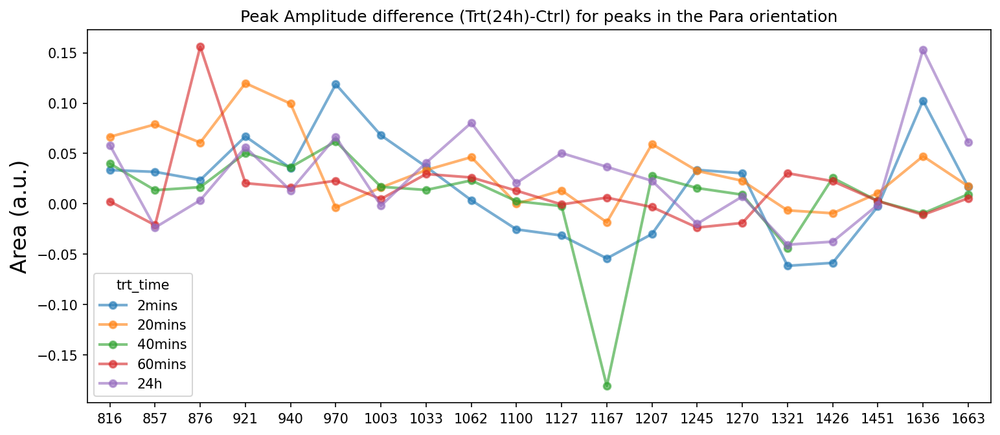

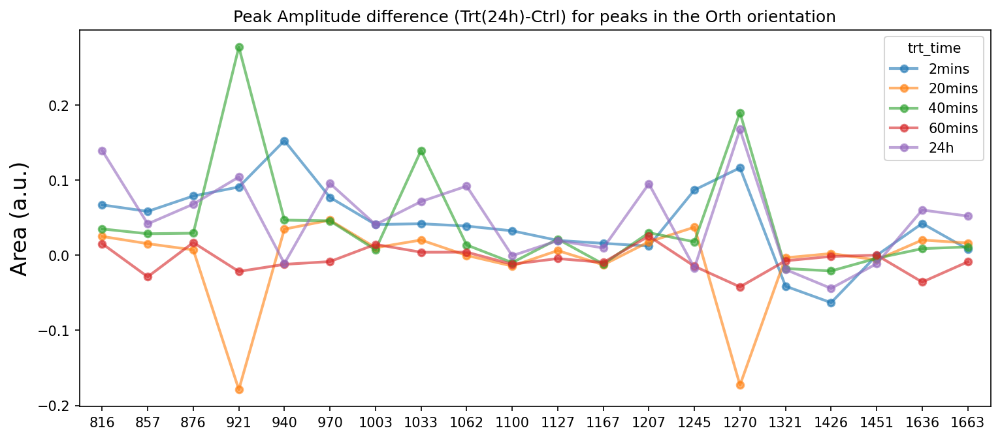

In [180]:
diff_result_df = pd.DataFrame(diff_results)


#for p in peak_positions:
for tp in diff_result_df['orient'].unique():
    plt.figure(figsize = (12, 5), dpi = 150);
    sns.pointplot(
                    data = diff_result_df[(diff_result_df['orient']==tp) & (diff_result_df['peak_pos'].isin([1344, 1381]) == False)],
                        x = 'peak_pos',
                        y = 'diff_amp',
                        hue = 'trt_time',
                        #order = [816, 857, 876, 921, 940, 970, 1003, 1033, 1062, 1100, 1127, 1167, 
                         #       1207, 1245, 1270, 1321,  1381, 1426, 1451, 1636, 1663],#1344,
                        #['2mins','20mins', '40mins', '60mins', '24h'],
                           # width = .5,
                            #dodge = .5, 
                            linewidth = 2,
                            #marker_kws={'edgecolor': 'gray', 'linewidth': 1},
                           alpha = .6,
                           errorbar='se'
                    );
    plt.title(f'Peak Amplitude difference (Trt(24h)-Ctrl) for peaks in the {tp} orientation')
    plt.ylabel('Area (a.u.)', fontsize = 16)
    plt.xlabel('')

C:\Users\oadeji01\AppData\Local\Temp\ipykernel_1376\874550747.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize = (10, 5), dpi = 150);


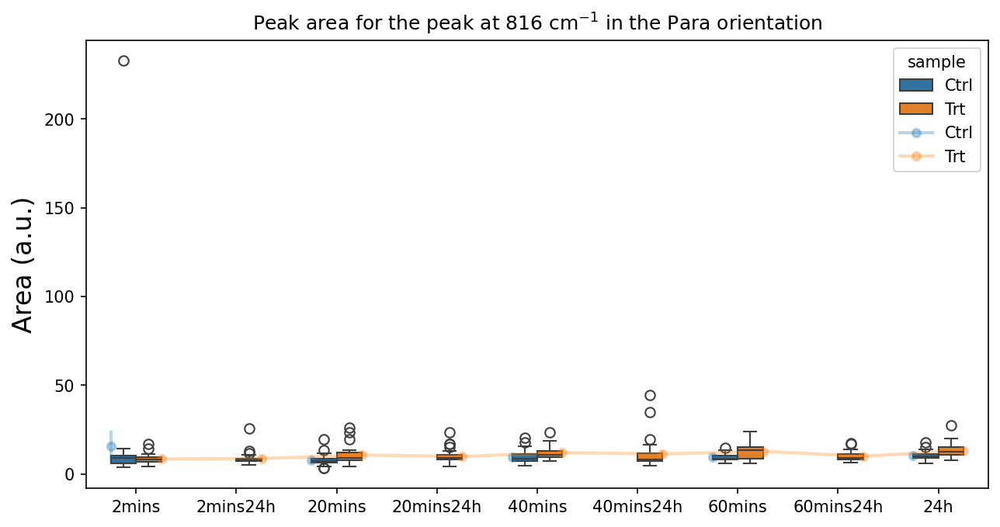

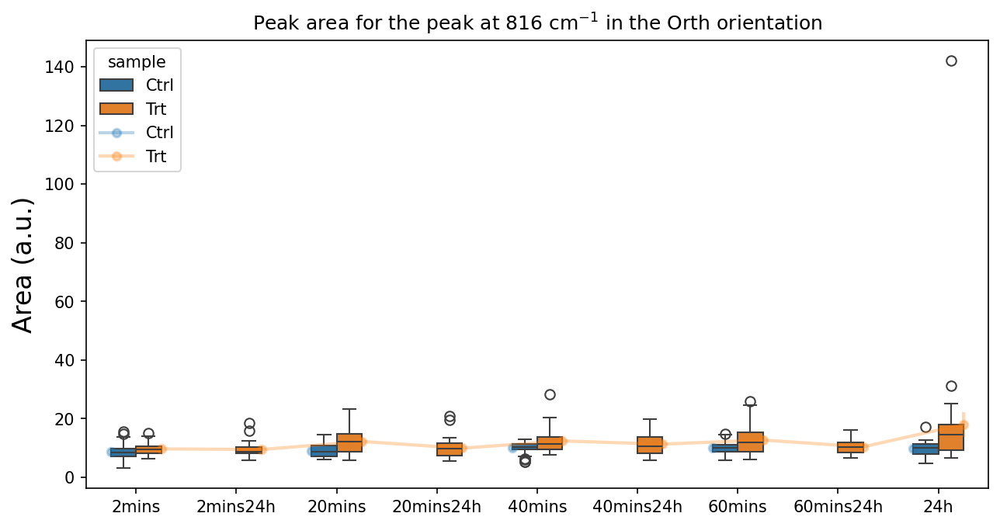

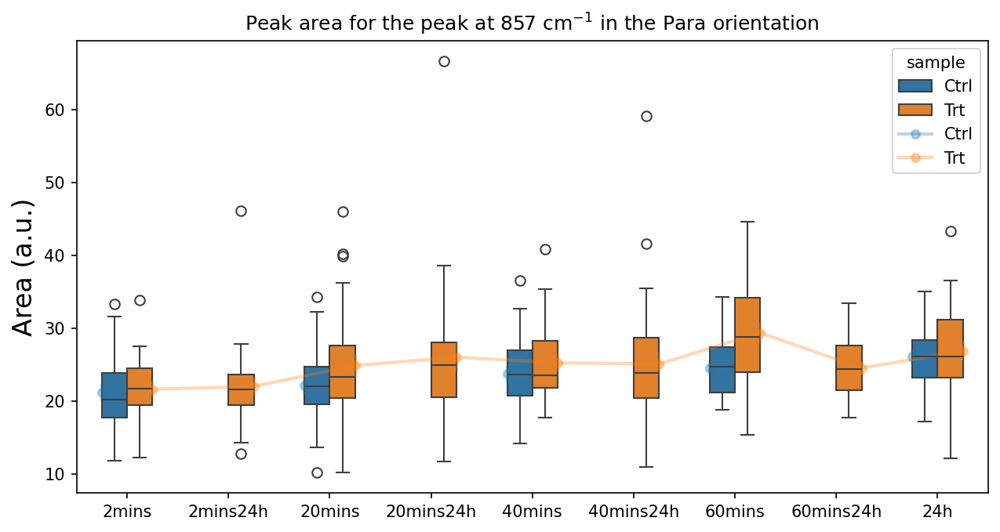

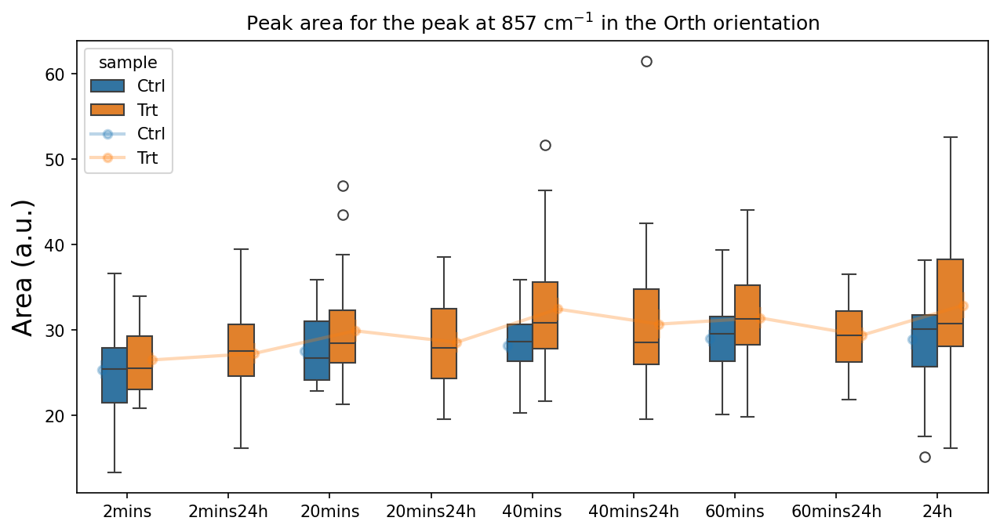

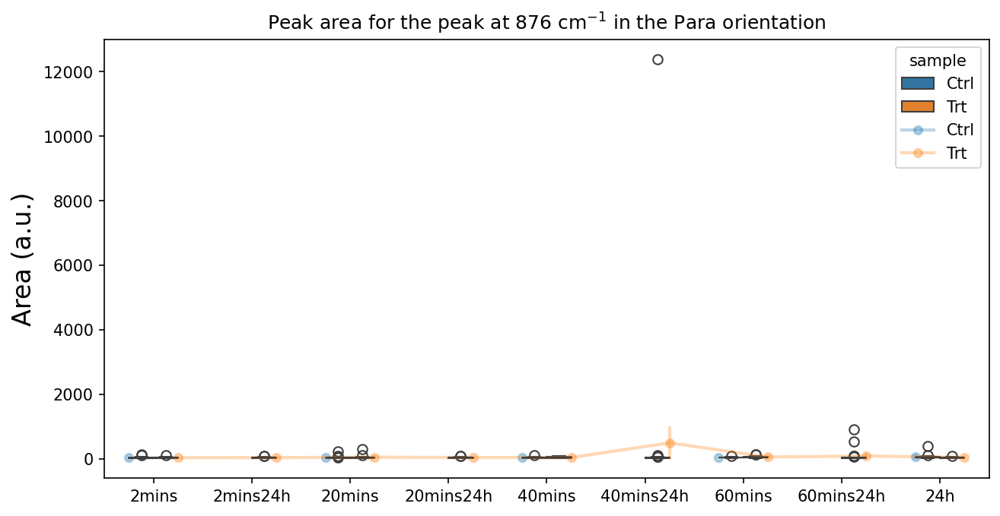

...

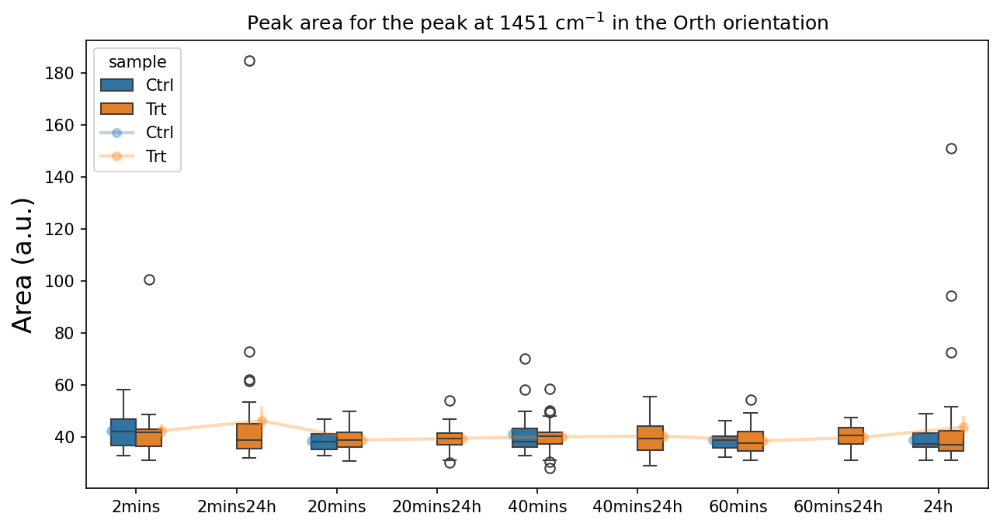

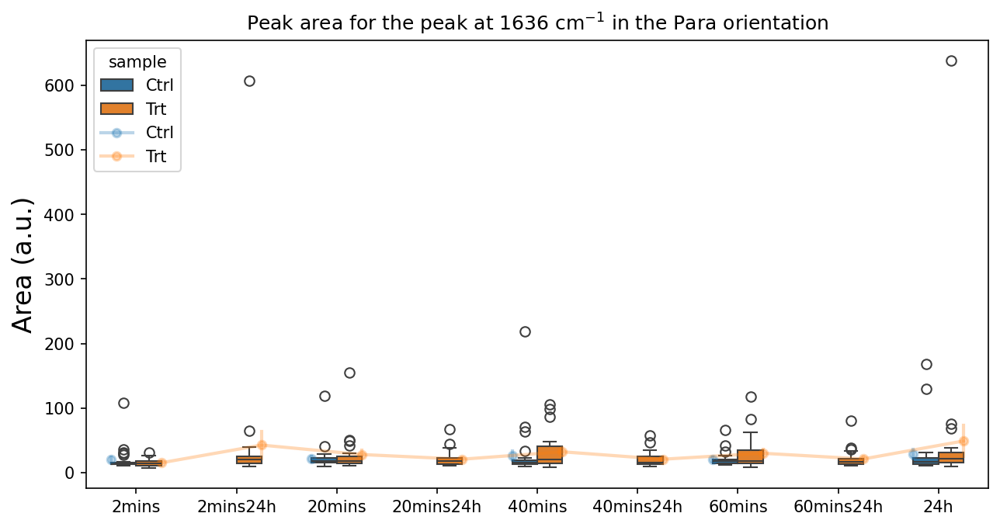

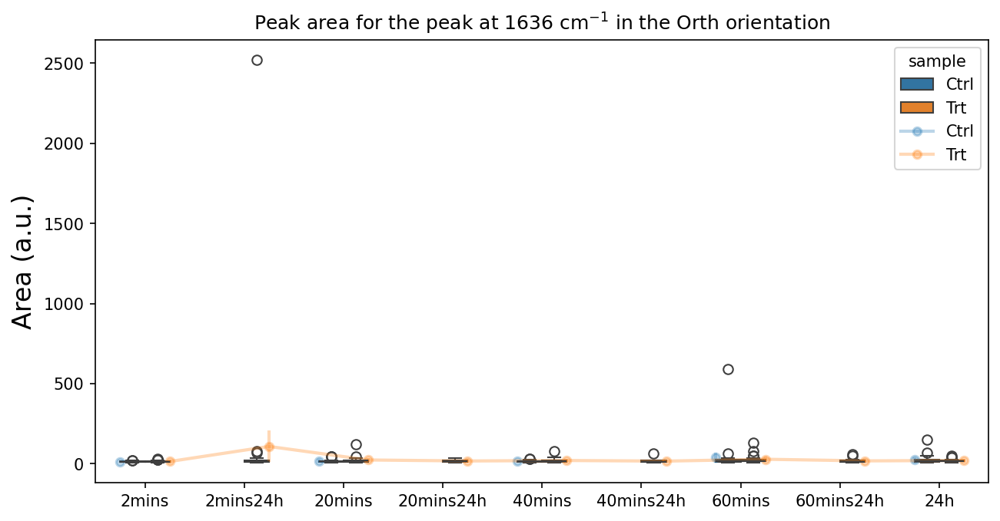

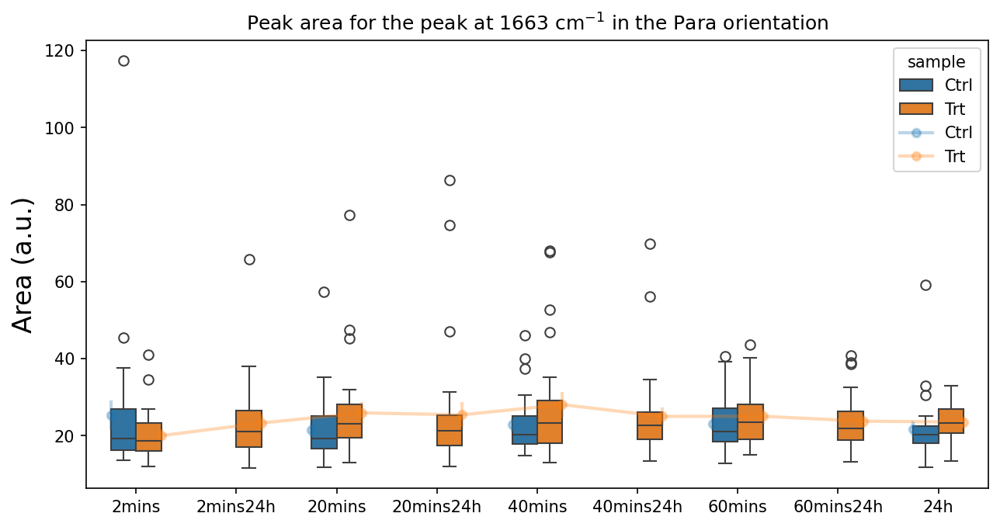

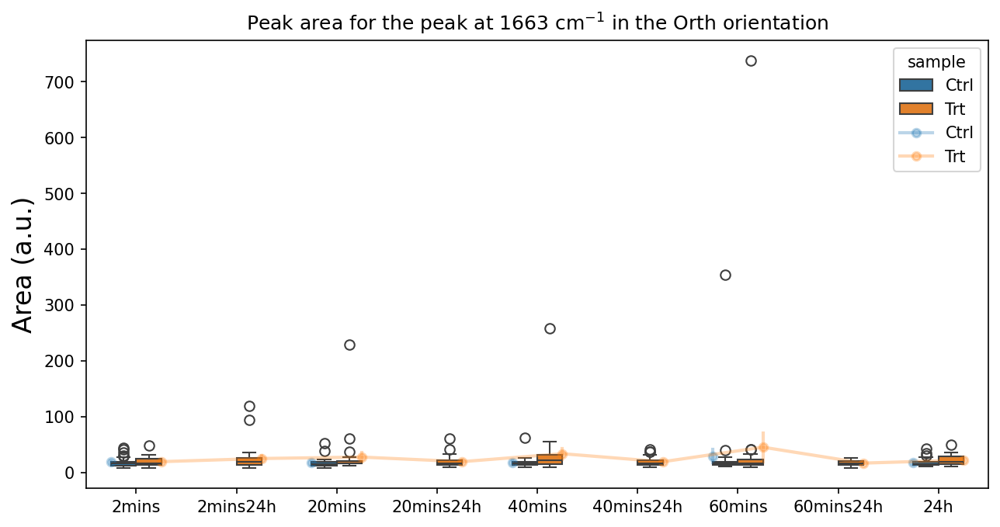

In [ ]:
for p in peak_positions:
    for j, tp in enumerate(['Para', 'Orth']):
        plt.figure(figsize = (10, 5), dpi = 150);
        dtt = result_df[(result_df['orient'].str.contains(tp)) & 
                                    (result_df['peak_pos'] == p) &
                                    (result_df['area']<= 100) #&
                                    #(result_df[''])
                                    ]
                #plt.figure(figsize = (15, 9), dpi = 150);
        sns.boxplot(
                    data = dtt,
                        x = 'trt_time',
                        y = 'area',
                        hue = 'sample',
                        order = ['2mins','2mins24h','20mins', '20mins24h','40mins', '40mins24h',  '60mins', 
                            '60mins24h', '24h'],
                            width = .5,
                           #alpha = .5
                    );
        sns.pointplot(
                    data = dtt,
                        x = 'trt_time',
                        y = 'area',
                        hue = 'sample',
                        order = ['2mins','2mins24h','20mins', '20mins24h','40mins', '40mins24h',  '60mins', 
                            '60mins24h', '24h'],
                            dodge = .5, linewidth = 2,
                            #marker_kws={'edgecolor': 'gray', 'linewidth': 1},
                           alpha = .3,
                           errorbar='se'
                    );
        plt.title(f'Peak area for the peak at {p} cm$^{{-1}}$ in the {tp} orientation')
        plt.ylabel('Area (a.u.)', fontsize = 16)
        plt.xlabel('')

In [141]:
from statsmodels.stats.multicomp import pairwise_tukeyhsd
for p in peak_positions:
    dtt = result_df[(result_df['orient'].str.contains('Orth')) & 
                                    (result_df['peak_pos'] == p) #&
                                    #(result_df['area']<= 100)
                                    ]
    # perform Tukey's test
    tukey = pairwise_tukeyhsd(endog=dtt['area'],
                            groups=dtt['sample'],
                            alpha=0.05)

    #display results
    print(f'Tukey HSD results for peak at {p} cm$^{-1}$ in the Parallel Orientation')
    print(tukey)
    print('*******************************************************************************')

Tukey HSD results for peak at 857 cm$^-1$ in the Parallel Orientation
Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
  Ctrl    Trt   4.8435 0.1107 -1.1118 10.7988  False
----------------------------------------------------
*******************************************************************************
Tukey HSD results for peak at 921 cm$^-1$ in the Parallel Orientation
 Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper   reject
-----------------------------------------------------
  Ctrl    Trt   89.452 0.0611 -4.2016 183.1055  False
-----------------------------------------------------
*******************************************************************************
Tukey HSD results for peak at 940 cm$^-1$ in the Parallel Orientation
Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj lower  upper  

In [62]:
fit_mean = result_df.groupby(['sample', 'trt_time', 'orient', 'peak_pos']).mean(numeric_only=True).reset_index()
fit_mean[fit_mean]

,sample,trt_time,orient,peak_pos,fit_pos,amp,fwhm,area
0,Ctrl,20mins,Orth,816,816.271744,0.477713,17.637239,9.019748
1,Ctrl,20mins,Orth,857,857.371105,1.044817,24.732490,27.517565
2,Ctrl,20mins,Orth,876,869.636035,0.800166,48.502113,42.369207
3,Ctrl,20mins,Orth,921,931.829312,1.040894,43.102532,86.034180
4,Ctrl,20mins,Orth,940,939.909825,1.518372,22.142293,35.774184
...,...,...,...,...,...,...,...,...
499,Trt,60mins24h,Para,1381,1380.639999,1.006521,78.969080,85.305304
500,Trt,60mins24h,Para,1426,1426.009176,0.867564,46.439438,42.961632
501,Trt,60mins24h,Para,1451,1450.422534,1.048991,38.113217,42.530575
502,Trt,60mins24h,Para,1636,1638.059460,0.413491,48.799765,21.181013


C:\Users\oadeji01\AppData\Local\Temp\ipykernel_27900\2422181490.py:23: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([label.get_text()[9:] for label in ax.get_xticklabels()]);
C:\Users\oadeji01\AppData\Local\Temp\ipykernel_27900\2422181490.py:23: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([label.get_text()[9:] for label in ax.get_xticklabels()]);
C:\Users\oadeji01\AppData\Local\Temp\ipykernel_27900\2422181490.py:23: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([label.get_text()[9:] for label in ax.get_xticklabels()]);
C:\Users\oadeji01\AppData\Local\Temp\ipykernel_27900\2422181490.py:23: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after s

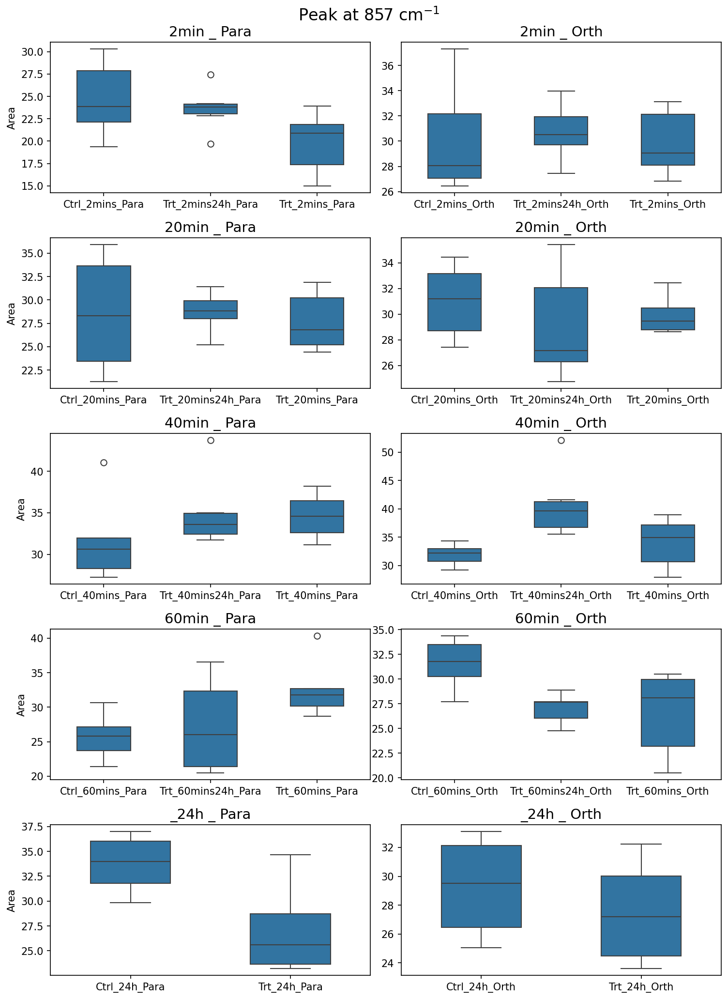

C:\Users\oadeji01\AppData\Local\Temp\ipykernel_27900\2422181490.py:23: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([label.get_text()[9:] for label in ax.get_xticklabels()]);
C:\Users\oadeji01\AppData\Local\Temp\ipykernel_27900\2422181490.py:23: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([label.get_text()[9:] for label in ax.get_xticklabels()]);
C:\Users\oadeji01\AppData\Local\Temp\ipykernel_27900\2422181490.py:23: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([label.get_text()[9:] for label in ax.get_xticklabels()]);
C:\Users\oadeji01\AppData\Local\Temp\ipykernel_27900\2422181490.py:23: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after s

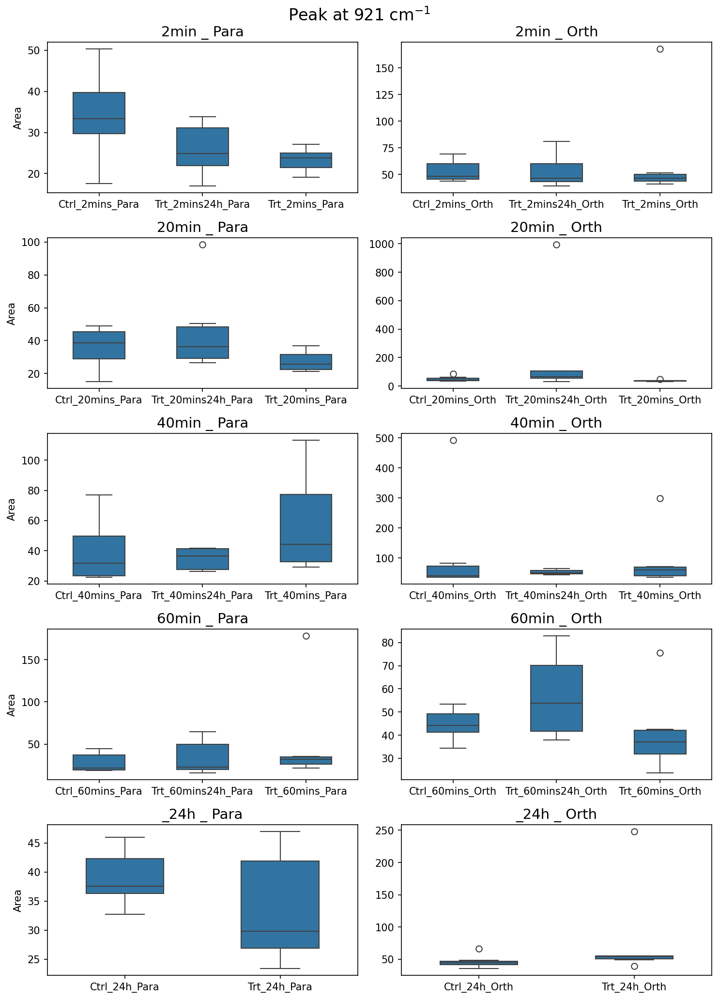

C:\Users\oadeji01\AppData\Local\Temp\ipykernel_27900\2422181490.py:23: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([label.get_text()[9:] for label in ax.get_xticklabels()]);
C:\Users\oadeji01\AppData\Local\Temp\ipykernel_27900\2422181490.py:23: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([label.get_text()[9:] for label in ax.get_xticklabels()]);
C:\Users\oadeji01\AppData\Local\Temp\ipykernel_27900\2422181490.py:23: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([label.get_text()[9:] for label in ax.get_xticklabels()]);
C:\Users\oadeji01\AppData\Local\Temp\ipykernel_27900\2422181490.py:23: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after s

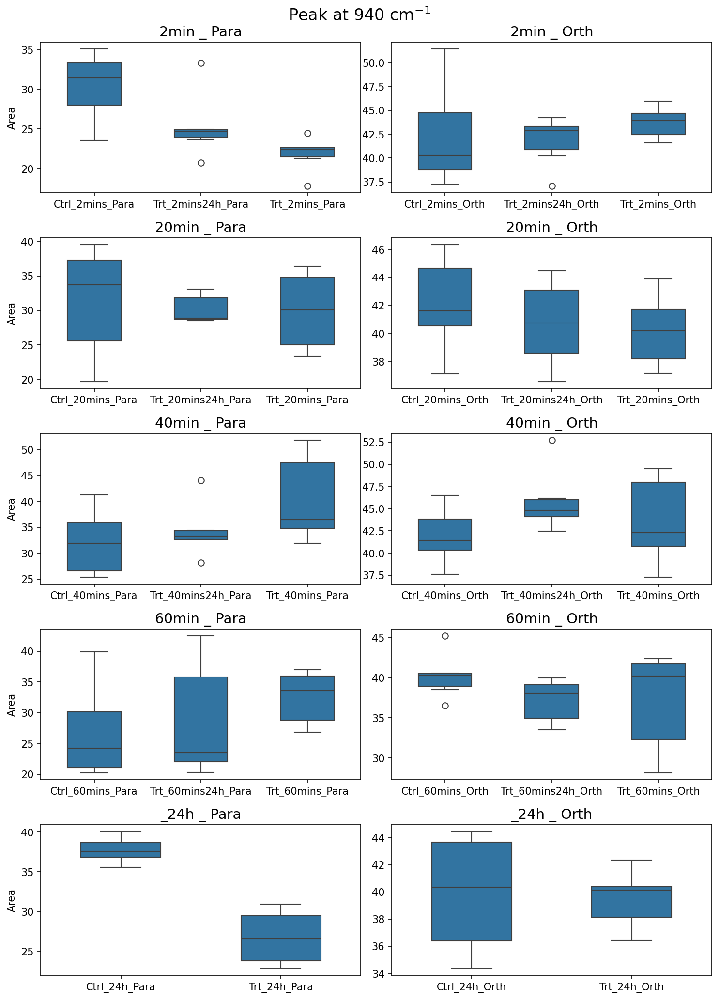

C:\Users\oadeji01\AppData\Local\Temp\ipykernel_27900\2422181490.py:23: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([label.get_text()[9:] for label in ax.get_xticklabels()]);
C:\Users\oadeji01\AppData\Local\Temp\ipykernel_27900\2422181490.py:23: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([label.get_text()[9:] for label in ax.get_xticklabels()]);
C:\Users\oadeji01\AppData\Local\Temp\ipykernel_27900\2422181490.py:23: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([label.get_text()[9:] for label in ax.get_xticklabels()]);
C:\Users\oadeji01\AppData\Local\Temp\ipykernel_27900\2422181490.py:23: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after s

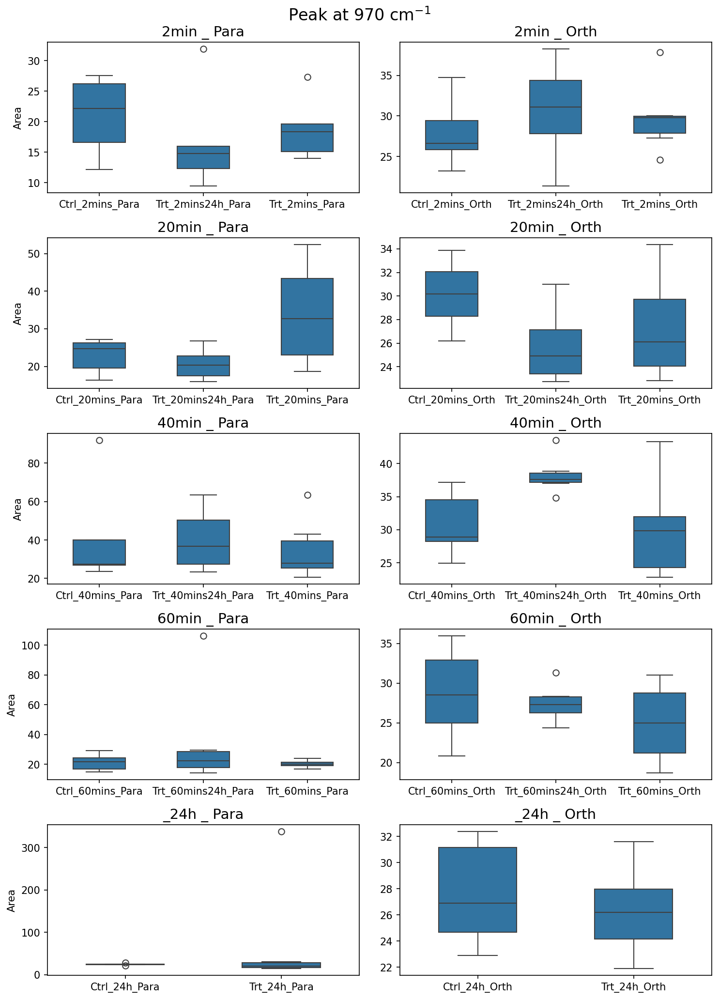

C:\Users\oadeji01\AppData\Local\Temp\ipykernel_27900\2422181490.py:23: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([label.get_text()[9:] for label in ax.get_xticklabels()]);
C:\Users\oadeji01\AppData\Local\Temp\ipykernel_27900\2422181490.py:23: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([label.get_text()[9:] for label in ax.get_xticklabels()]);
C:\Users\oadeji01\AppData\Local\Temp\ipykernel_27900\2422181490.py:23: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([label.get_text()[9:] for label in ax.get_xticklabels()]);
C:\Users\oadeji01\AppData\Local\Temp\ipykernel_27900\2422181490.py:23: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after s

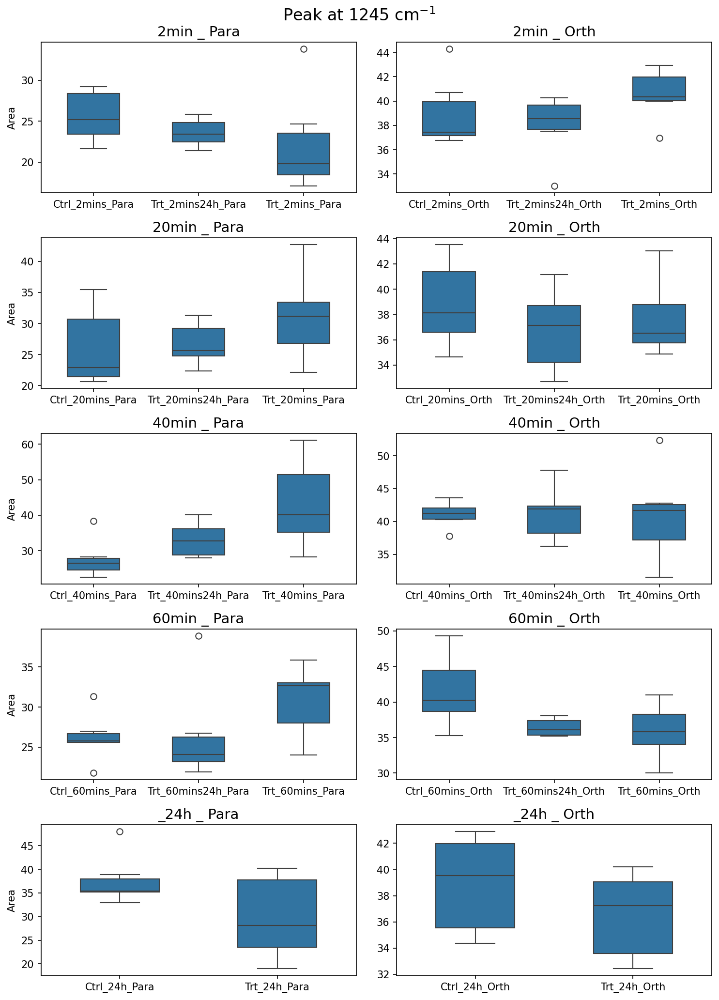

C:\Users\oadeji01\AppData\Local\Temp\ipykernel_27900\2422181490.py:23: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([label.get_text()[9:] for label in ax.get_xticklabels()]);
C:\Users\oadeji01\AppData\Local\Temp\ipykernel_27900\2422181490.py:23: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([label.get_text()[9:] for label in ax.get_xticklabels()]);
C:\Users\oadeji01\AppData\Local\Temp\ipykernel_27900\2422181490.py:23: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([label.get_text()[9:] for label in ax.get_xticklabels()]);
C:\Users\oadeji01\AppData\Local\Temp\ipykernel_27900\2422181490.py:23: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after s

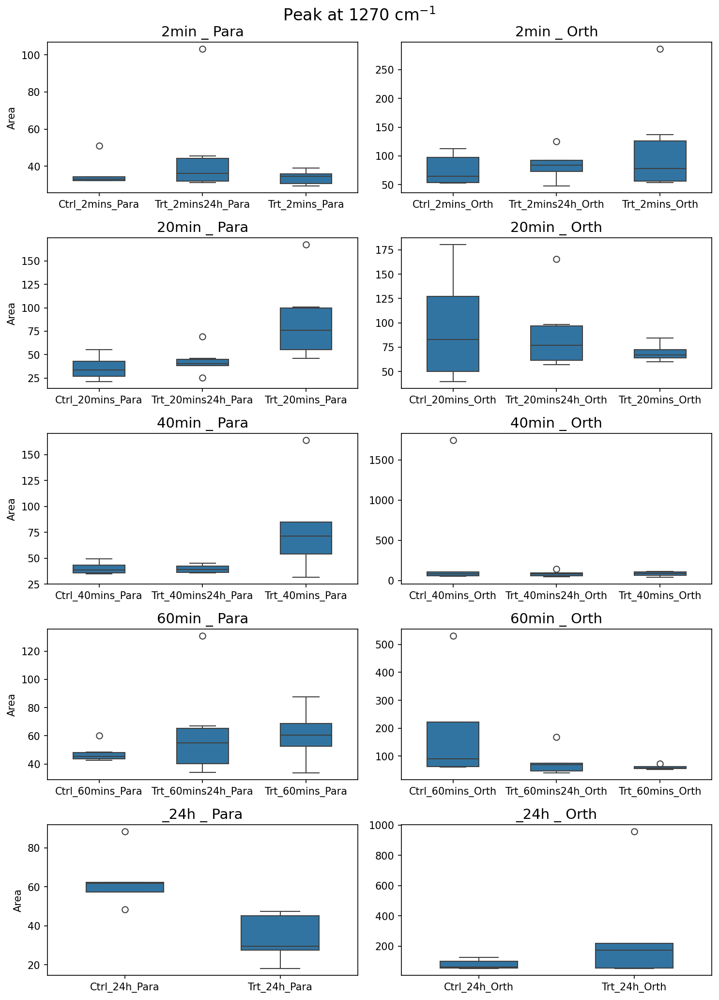

C:\Users\oadeji01\AppData\Local\Temp\ipykernel_27900\2422181490.py:23: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([label.get_text()[9:] for label in ax.get_xticklabels()]);
C:\Users\oadeji01\AppData\Local\Temp\ipykernel_27900\2422181490.py:23: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([label.get_text()[9:] for label in ax.get_xticklabels()]);
C:\Users\oadeji01\AppData\Local\Temp\ipykernel_27900\2422181490.py:23: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([label.get_text()[9:] for label in ax.get_xticklabels()]);
C:\Users\oadeji01\AppData\Local\Temp\ipykernel_27900\2422181490.py:23: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after s

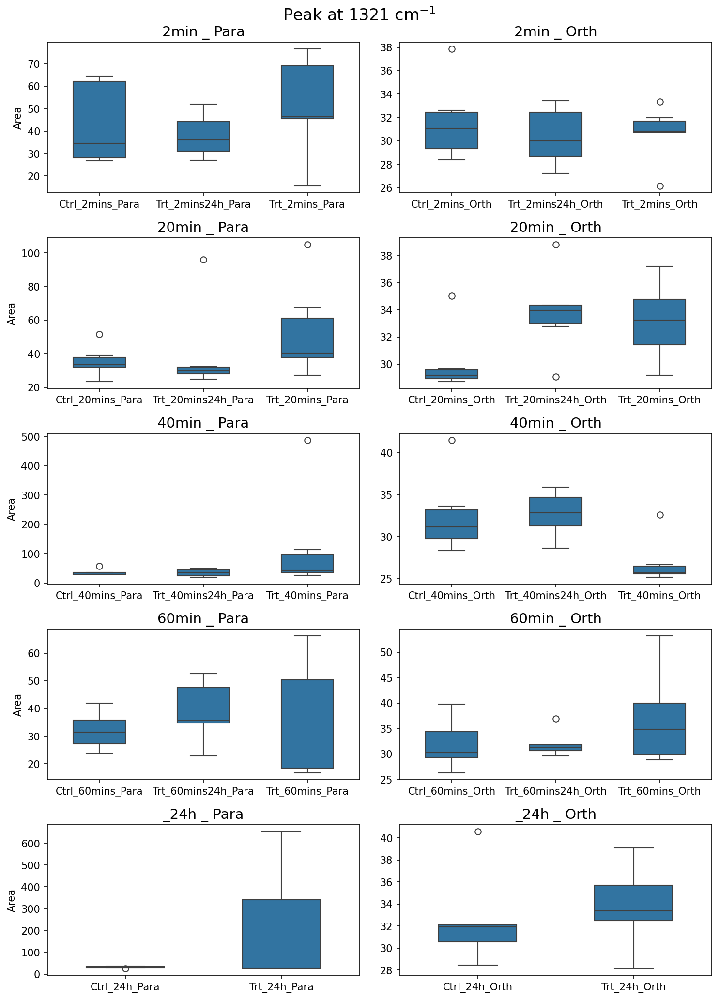

C:\Users\oadeji01\AppData\Local\Temp\ipykernel_27900\2422181490.py:23: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([label.get_text()[9:] for label in ax.get_xticklabels()]);
C:\Users\oadeji01\AppData\Local\Temp\ipykernel_27900\2422181490.py:23: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([label.get_text()[9:] for label in ax.get_xticklabels()]);
C:\Users\oadeji01\AppData\Local\Temp\ipykernel_27900\2422181490.py:23: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([label.get_text()[9:] for label in ax.get_xticklabels()]);
C:\Users\oadeji01\AppData\Local\Temp\ipykernel_27900\2422181490.py:23: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after s

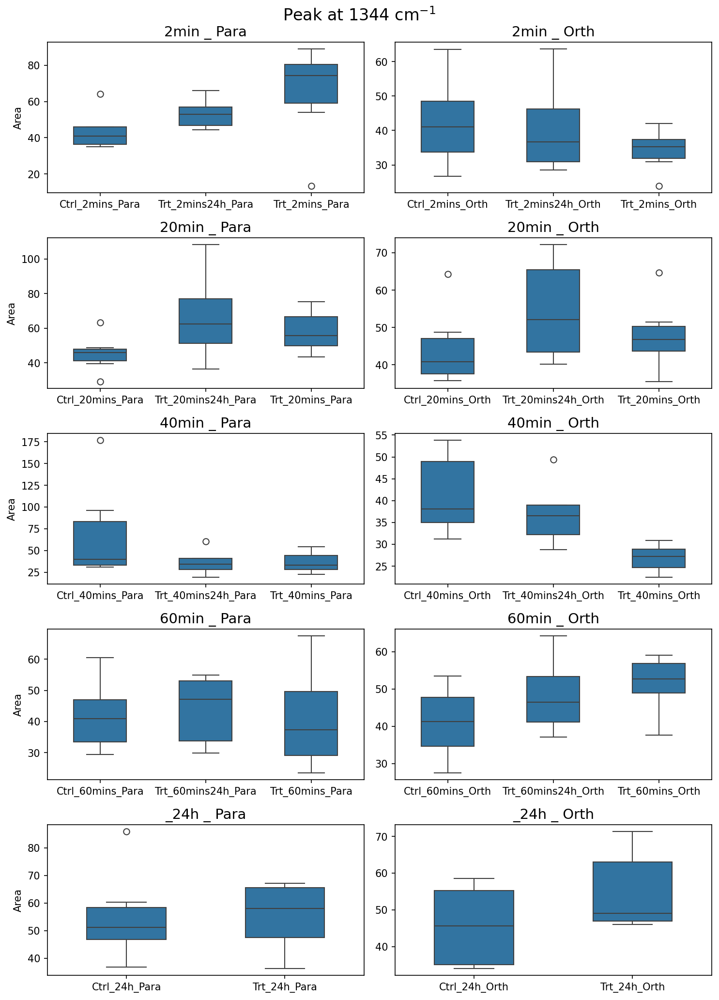

C:\Users\oadeji01\AppData\Local\Temp\ipykernel_27900\2422181490.py:23: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([label.get_text()[9:] for label in ax.get_xticklabels()]);
C:\Users\oadeji01\AppData\Local\Temp\ipykernel_27900\2422181490.py:23: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([label.get_text()[9:] for label in ax.get_xticklabels()]);
C:\Users\oadeji01\AppData\Local\Temp\ipykernel_27900\2422181490.py:23: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([label.get_text()[9:] for label in ax.get_xticklabels()]);
C:\Users\oadeji01\AppData\Local\Temp\ipykernel_27900\2422181490.py:23: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after s

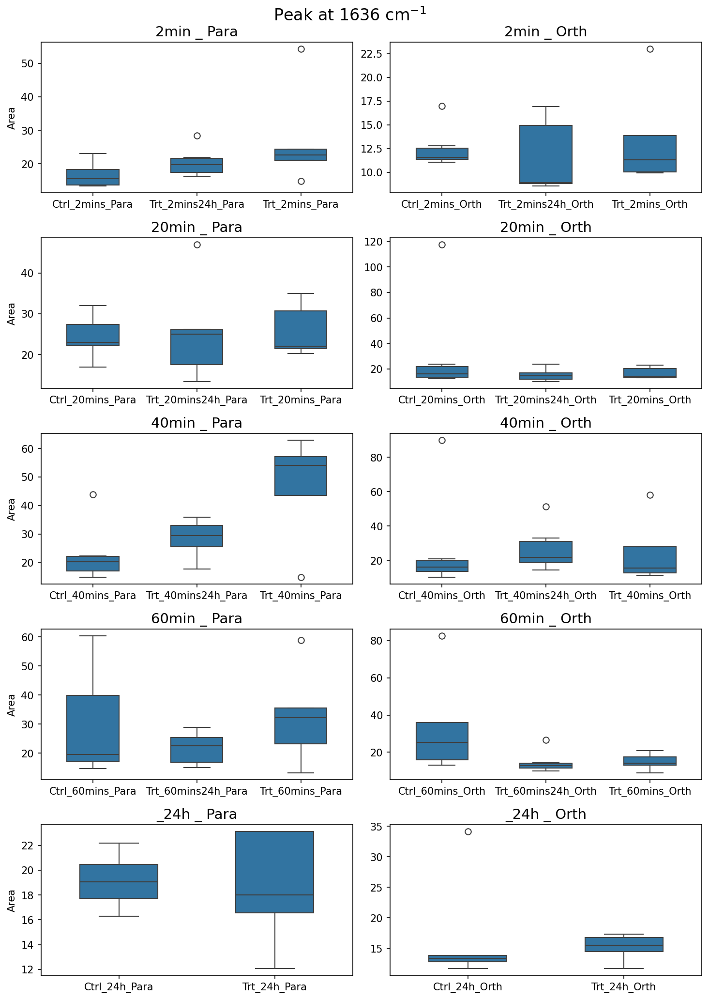

C:\Users\oadeji01\AppData\Local\Temp\ipykernel_27900\2422181490.py:23: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([label.get_text()[9:] for label in ax.get_xticklabels()]);
C:\Users\oadeji01\AppData\Local\Temp\ipykernel_27900\2422181490.py:23: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([label.get_text()[9:] for label in ax.get_xticklabels()]);
C:\Users\oadeji01\AppData\Local\Temp\ipykernel_27900\2422181490.py:23: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([label.get_text()[9:] for label in ax.get_xticklabels()]);
C:\Users\oadeji01\AppData\Local\Temp\ipykernel_27900\2422181490.py:23: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after s

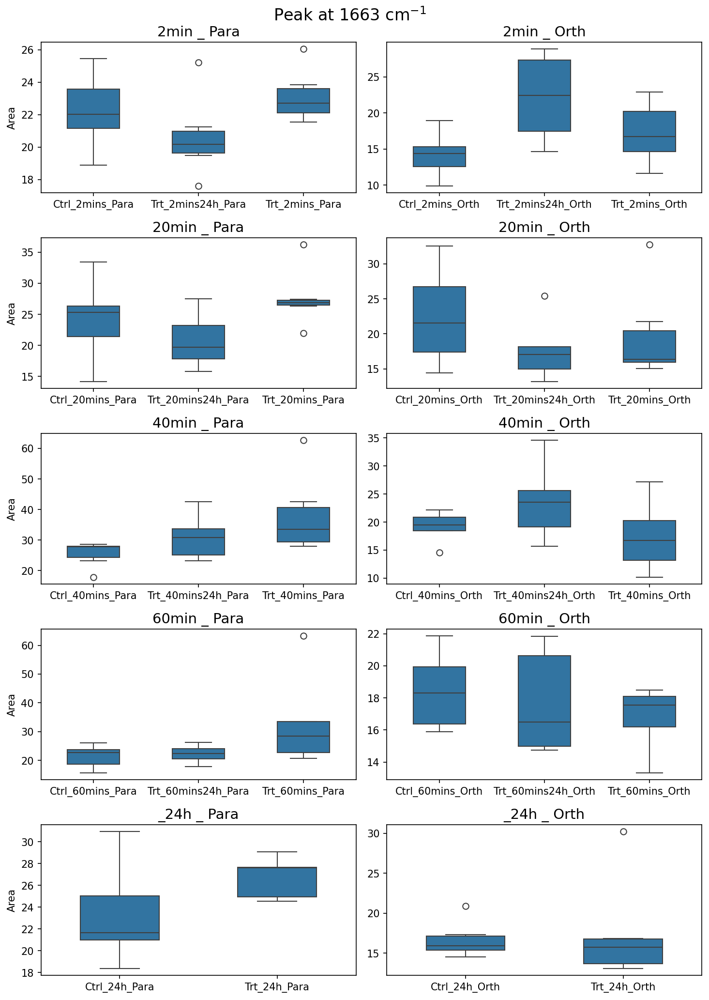

In [ ]:
for p in peak_positions:
    fig, axes = plt.subplots(5, 2, figsize = (10, 14), dpi = 150)
#axes = axes.flatten()


    for i, ort in enumerate(['2min', '20min', '40min', '60min', '_24h']):
        for j, tp in enumerate(['Para', 'Orth']):
            
            ax = axes[i, j]
            subset =  results[
                (results['group'].str.contains(ort)) & 
                (results['group'].str.contains(tp)) & 
                (results['peak_pos'] == p)
                ]
            #print(subset)
            sns.boxplot(
                        data = subset,
                        x = 'group',
                        y = 'area',
                        ax = ax,
                        width = .5
                        );
            ax.set_xticklabels([label.get_text()[9:] for label in ax.get_xticklabels()]);
            ax.set_title(f"{ort} _ {tp}", fontsize=14);
            ax.set_xlabel("");
            ax.set_ylabel("Area" if j == 0 else "");  # only left column shows y-axis label
    plt.suptitle(f"Peak at {p} cm$^{{-1}}$", fontsize = 16);

    plt.tight_layout();
    plt.show();